# Practical Session : Mathematical Morphology and Histogram manipulations

The aim of this practical work is to get acquainted with mathematical morphology
transformations. Applying different operations with several structuring elements on
simple images will allow you understanding the actions, effects and properties of the
operations, the role of the structuring element, as well as the need for appropriate
pre-processing depending on the application at hand.

In this session, we will mainly focus on functions from the skimage.morphology package.

First, you have to download a set of images that you will use throughout the TP: https://partage.imt.fr/index.php/s/9YPTAzKsiXHQWH3

In [1]:
## imports
import matplotlib.pyplot as plt
import skimage.io as skio
import skimage
import numpy as np
import skimage.morphology as morpho
import skimage.segmentation as seg
student = True

## Mathematical morphology

### The structuring element
The basic idea in mathematical orphology is to probe an image with a simple, pre-defined shape, drawing conclusions on how this shape fits or misses the shapes in the image. This simple "probe" is called the structuring element. For example, it can take the shape of a square, a disk or a diamond, with a predefined radius.

Use the function morpho.disk() of the morpho library to visualize a disk structuring element of radius 5. 

[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


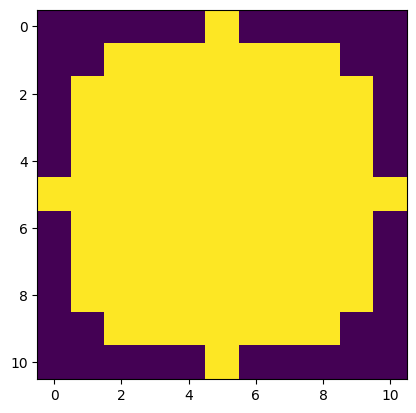

In [2]:
if student :
  strell = morpho.disk(5)

print(strell)
plt.imshow(strell)
plt.show()

Find a way to create a vertical line as a structuring element with parameter length l :

[[1 1]
 [1 1]
 [1 1]
 [1 1]
 [1 1]]


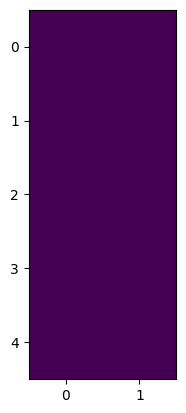

In [4]:
def line_strell(width,length):
  if student :
    strell = morpho.rectangle(nrows=length,ncols=width)
  return strell

strell = line_strell(2,5)
print(strell)
plt.imshow(strell)
plt.show()

### Binary Morphology
In this section, we will work on a cyto-image. Make sure to properly load the "cell.tif" image. Apply a thresholding of level t = 150 to that image to turn it into a binary image. Visualize the result in greyscale, by using the imshow function.

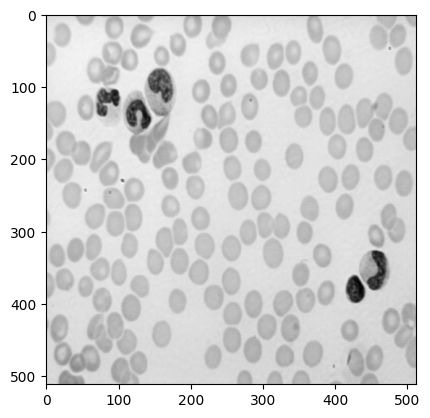

In [17]:
plt.imshow(img,cmap='gray')
plt.show()

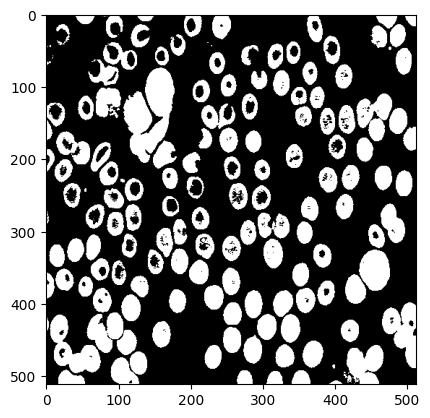

In [33]:
#load the cell image in grayscale and display it 
if student:
    img = skio.imread("images/cell.tif")
    threshold = 150
    binary_img=np.where(img<150,1,0)
    
    plt.imshow(binary_img,cmap='gray')
    plt.show()
    

We will first start by applying simple binary morphological operations on those images. You will try the following operations:
- erosion
- dilation
- opening
- closing

You will try to visualize the results by varying the structuring element and its size.  

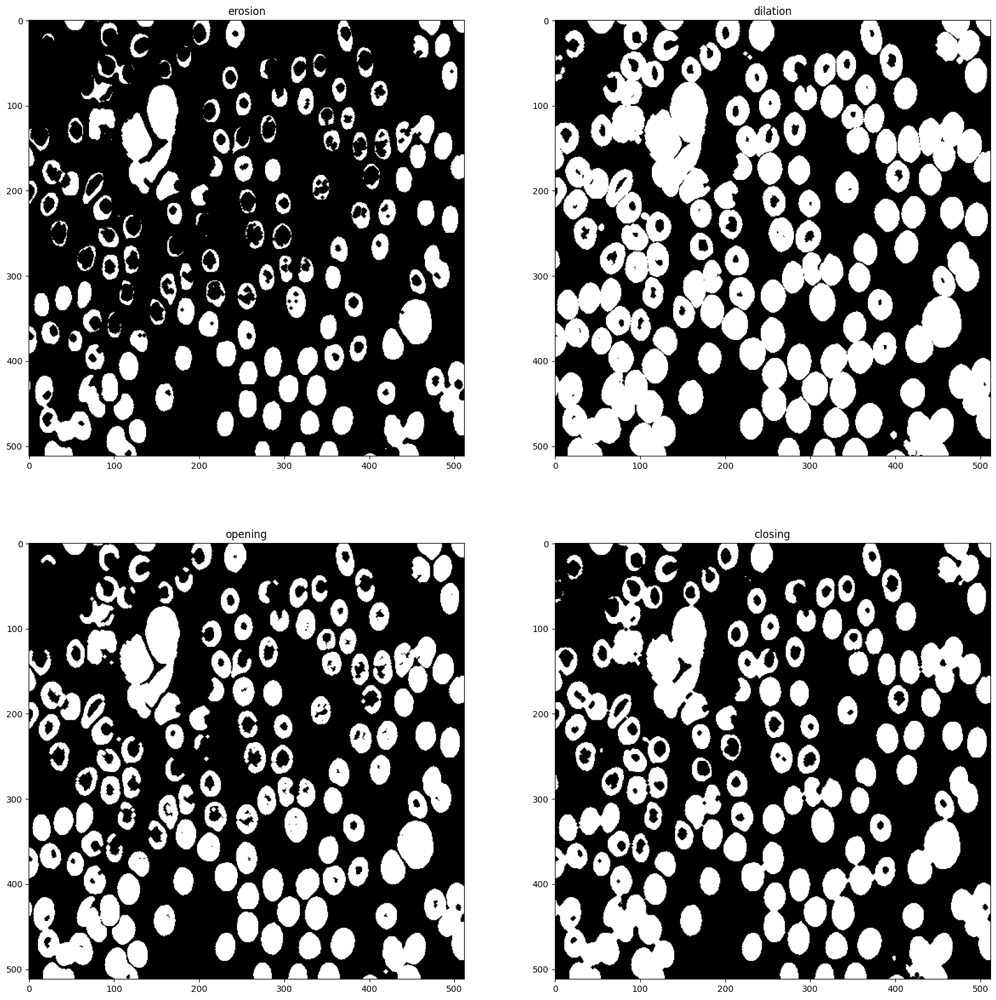

In [34]:
strell = morpho.disk(2)
fig,ax = plt.subplots(2, 2, figsize=(20,20))
imgs = [morpho.erosion(binary_img,strell),morpho.dilation(binary_img,strell),morpho.opening(binary_img,strell),morpho.closing(binary_img,strell)]# Add in this list the 4 images, obtained with the four operations
names = ["erosion","dilation","opening","closing"]
for i in range(4):
  ax[i//2,i%2].set_title(names[i])
  ax[i//2,i%2].imshow(imgs[i],cmap = "gray")


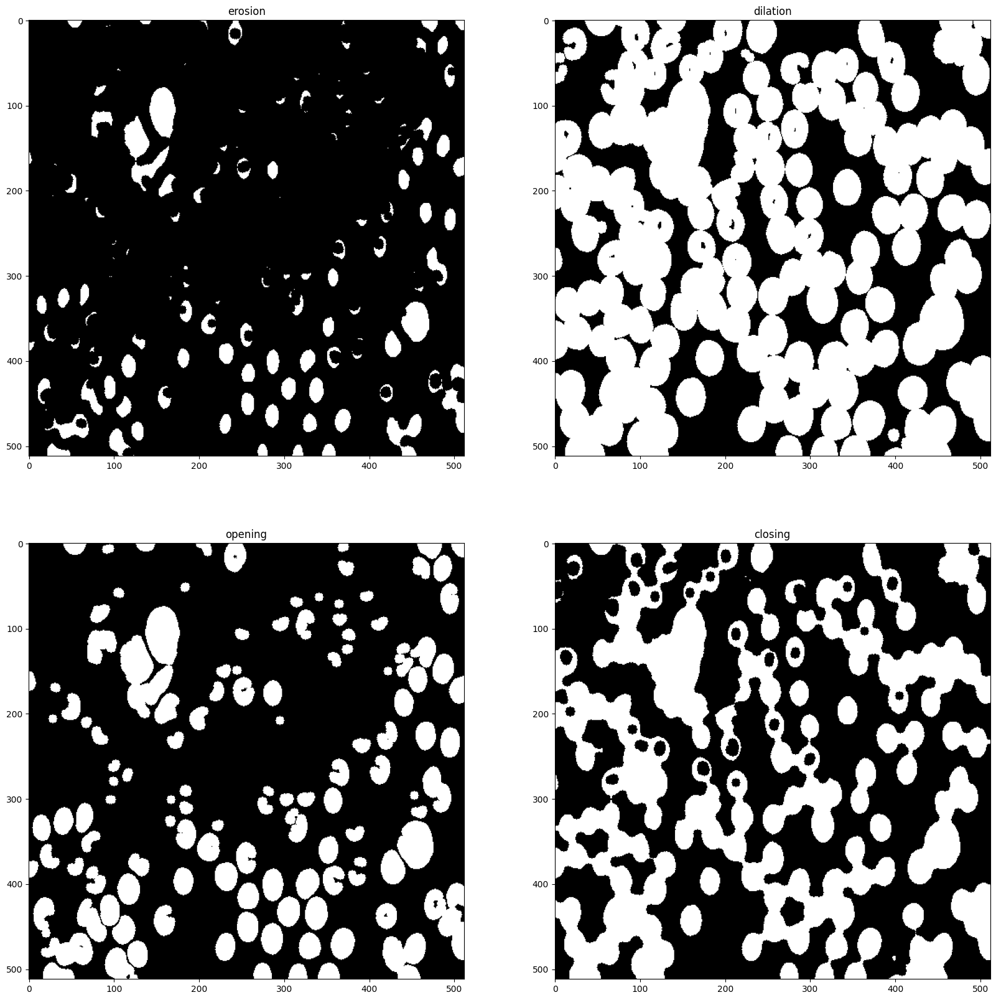

In [35]:
if student :
    strell = morpho.disk(5)
    fig,ax = plt.subplots(2, 2, figsize=(20,20))
    plt.title('radius = 5')
    imgs = [morpho.erosion(binary_img,strell),morpho.dilation(binary_img,strell),morpho.opening(binary_img,strell),morpho.closing(binary_img,strell)]# Add in this list the 4 images, obtained with the four operations
    names = ["erosion","dilation","opening","closing"]
    for i in range(4):
      ax[i//2,i%2].set_title(names[i])
      ax[i//2,i%2].imshow(imgs[i],cmap = "gray")

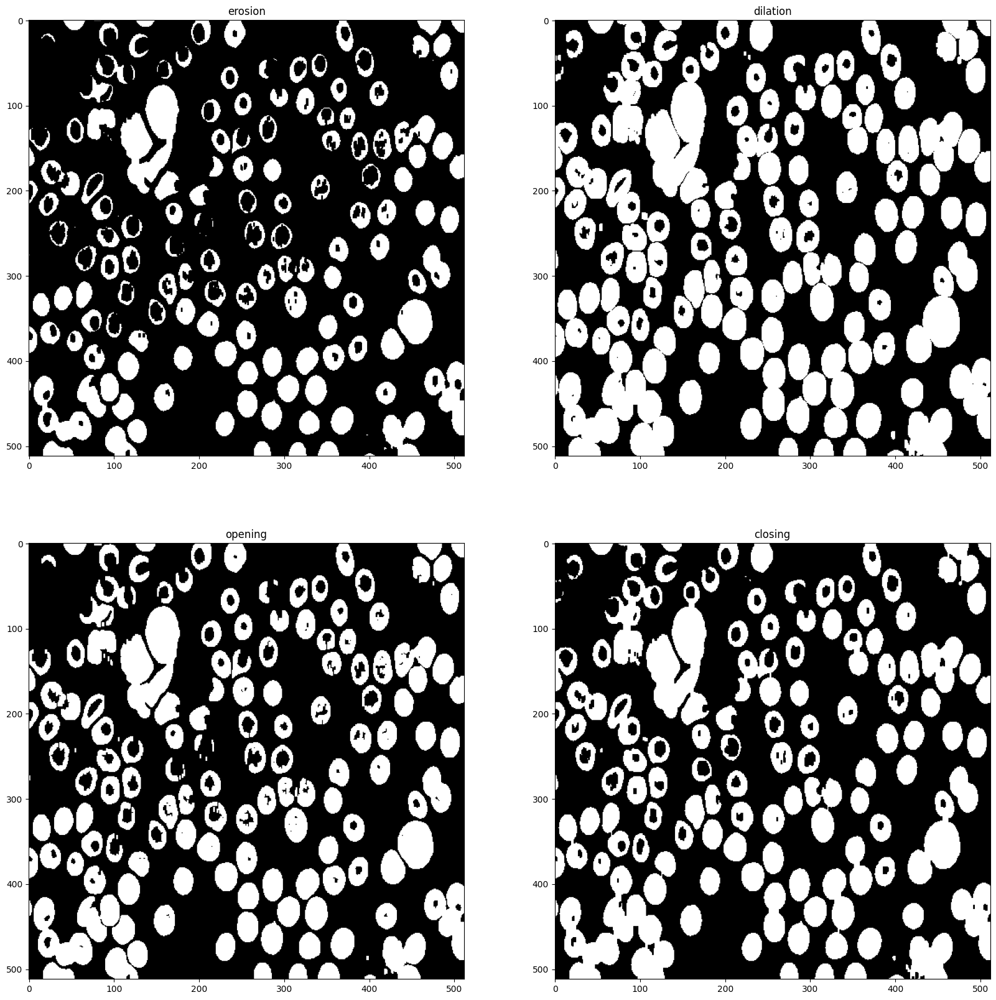

In [36]:
if student :
    strell = line_strell(2,5)
    fig,ax = plt.subplots(2, 2, figsize=(20,20))
    imgs = [morpho.erosion(binary_img,strell),morpho.dilation(binary_img,strell),morpho.opening(binary_img,strell),morpho.closing(binary_img,strell)]# Add in this list the 4 images, obtained with the four operations
    names = ["erosion","dilation","opening","closing"]
    for i in range(4):
      ax[i//2,i%2].set_title(names[i])
      ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
    plt.show()
    

- **Q** : What is the influence of the shape of the structuring element ?
- **A** : The shape of the structuring element determines the specific features that will be emphasized or removed during morphological operations.
For example, a disk-shaped structuring element will tend to preserve round shapes, while a line-shaped structuring element will be more sensitive to linear features.
Different structuring elements will react differently to the image edges and shapes.  A vertical line will react differently to horizontal edges than a horizontal line.

- **Q** : What is the influence of the size of the structuring element ?
- **A** : The size of the structuring element directly influences the extent of the morphological transformation.
A larger structuring element will lead to more significant changes in the image, potentially removing finer details and smoothing out the edges.
Conversely, a smaller structuring element will have a more localized effect, preserving more fine details.
Increasing the size of the structuring element results in a stronger influence on the image, especially during dilation and erosion.

### Greyscale Morphology
In this section, we will use the bateau.tif image. Make sure to load it and visualize it in greyscale.


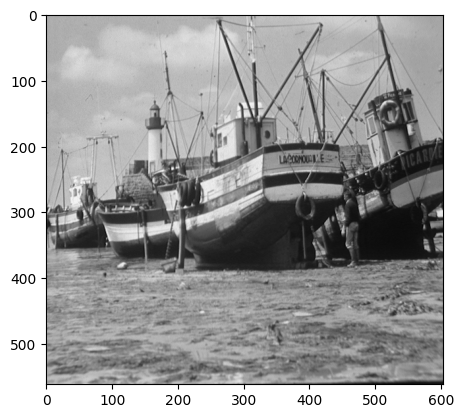

In [38]:
#load the bateau image in grayscale and display it 
if student:
  img = skio.imread("images/bateau.tif")
  plt.imshow(img, cmap = "gray")
  plt.show()

Apply the same 4 operations as before (dilation,erosion,opening,closing) and visualize the results. Try out different structuring elements and different sizes.

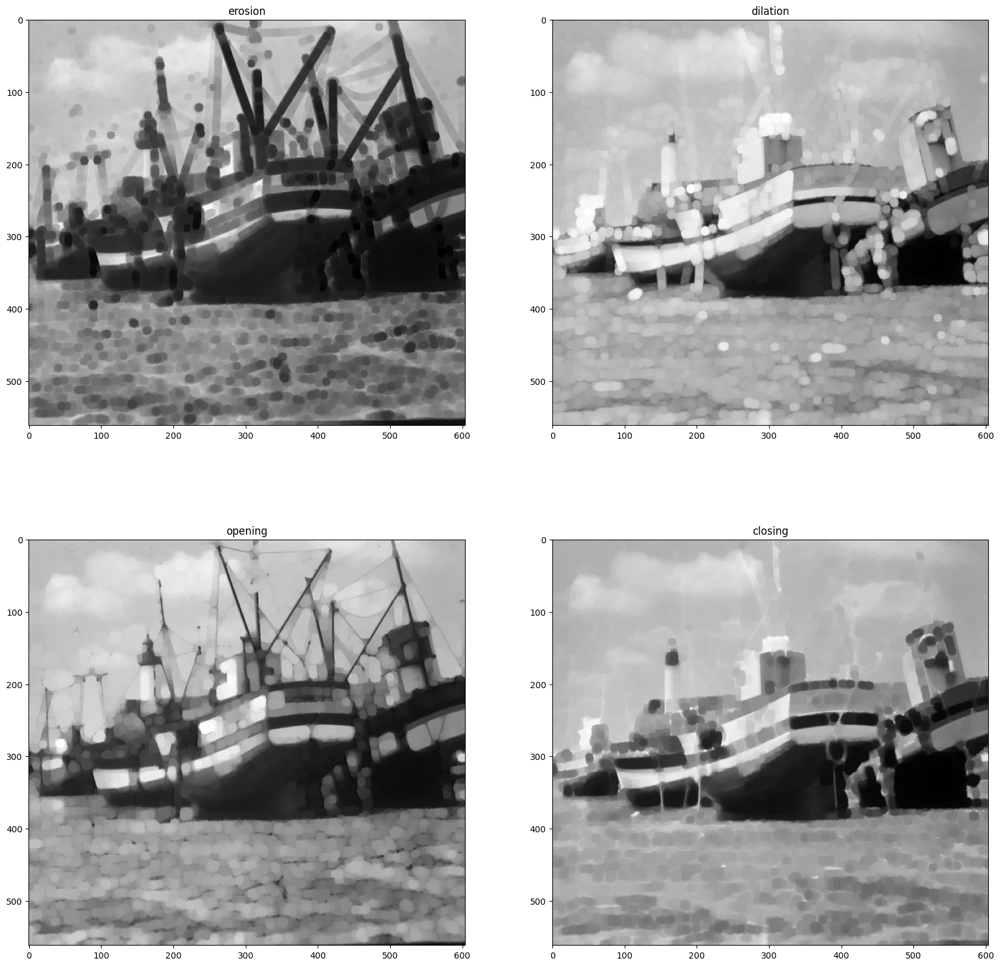

In [39]:
if student :
    strell = morpho.disk(5)
    fig,ax = plt.subplots(2, 2, figsize=(20,20))
    plt.title('radius = 5')
    imgs = [morpho.erosion(img,strell),morpho.dilation(img,strell),morpho.opening(img,strell),morpho.closing(img,strell)]# Add in this list the 4 images, obtained with the four operations
    names = ["erosion","dilation","opening","closing"]
    for i in range(4):
      ax[i//2,i%2].set_title(names[i])
      ax[i//2,i%2].imshow(imgs[i],cmap = "gray")

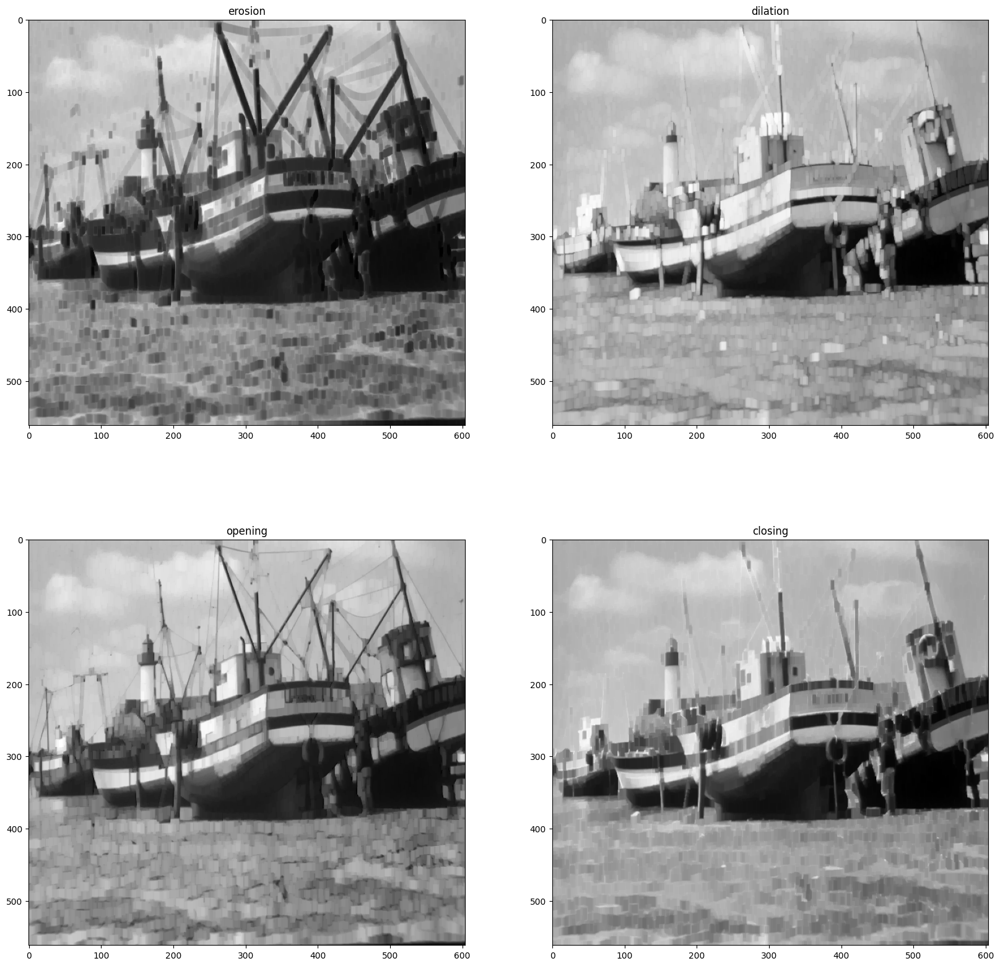

In [40]:
if student :
    strell = line_strell(4,10)
    fig,ax = plt.subplots(2, 2, figsize=(20,20))
    imgs = [morpho.erosion(img,strell),morpho.dilation(img,strell),morpho.opening(img,strell),morpho.closing(img,strell)]# Add in this list the 4 images, obtained with the four operations
    names = ["erosion","dilation","opening","closing"]
    for i in range(4):
      ax[i//2,i%2].set_title(names[i])
      ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
    plt.show()

- **Q** : What is the influence of the shape and size parameters of the structuring element ?
- **A** : In grayscale morphology, the shape and size of the structuring element play a similar role to their counterparts in binary morphology. However, the effects are more nuanced as the operations are based on pixel intensity values instead of just pixel presence or absence.
    In the bat image, using a larger disk-shaped structuring element for dilation expands brighter regions more significantly, whereas a smaller one creates a less pronounced expansion.
    Similarly, erosion with a larger structuring element shrinks brighter regions more strongly, while a smaller one has a less dramatic effect.

- **Q** : We then now try to illustrate the iterativity property. What is the result of a dilation by a disk structuring element of size 2 followed by a dilation by a disk structuring element of size 3? Compare it with a dilation by a disk of size 5. Explain.
- **A** : The result of a dilation by a disk of size 2 followed by a dilation by a disk of size 3 is generally the same as the result of a dilation by a disk of size 5. This is due to the iterativity property of dilation. It means that applying dilation with a smaller structuring element and then applying dilation with a larger structuring element is generally the same as applying dilation with a structuring element equivalent to the sum of the sizes of the previous structuring elements.

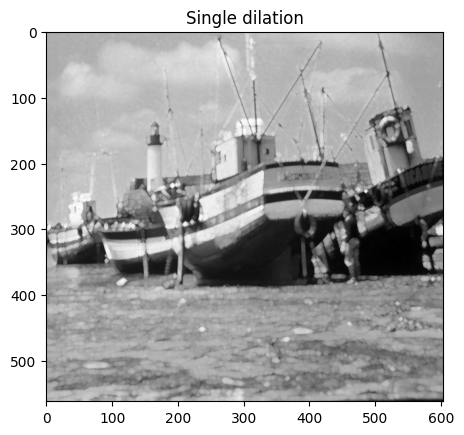

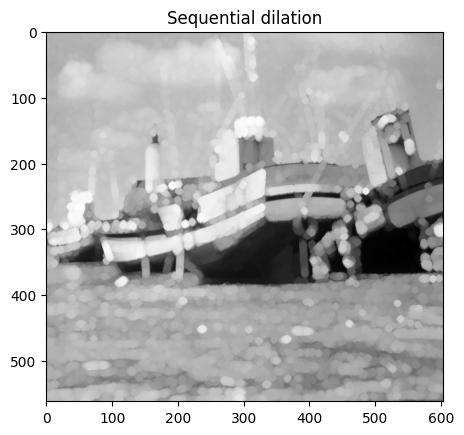

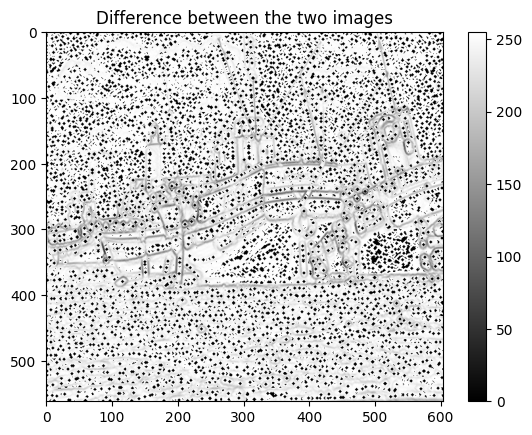

70128611
247761


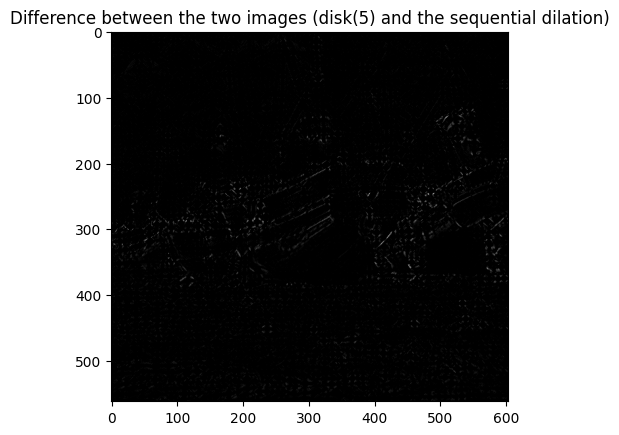

In [47]:
if student:
  ### start code
  dilation = morpho.dilation(img,morpho.disk(2))
  plt.imshow(dilation,cmap = "gray")
  plt.title("Single dilation")
  plt.show()

  sequential_dilation = morpho.dilation(dilation,morpho.disk(3))
  plt.imshow(sequential_dilation,cmap = "gray")
  plt.title("Sequential dilation")
  plt.show()

  plt.imshow(dilation-sequential_dilation,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation)))

plt.title('Difference between the two images (disk(5) and the sequential dilation)')
plt.imshow(morpho.dilation(img,morpho.disk(5))-sequential_dilation,cmap = "gray")
print(np.sum(np.abs(morpho.dilation(img,morpho.disk(5))-sequential_dilation)))
plt.show()


- **Q:** Plot the result of an dilation by a disk structuring element of size 2 followed by
an dilation by a disk structuring element of size 3?
Compare with a dilation of the image by (a disk of size 2 dilated by a disk of size 3). Please note that you might have to use the np.pad function to perform this. Conclude.
- **A:** the results are different this is because the dilatation operation is not associative

[[1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1]]


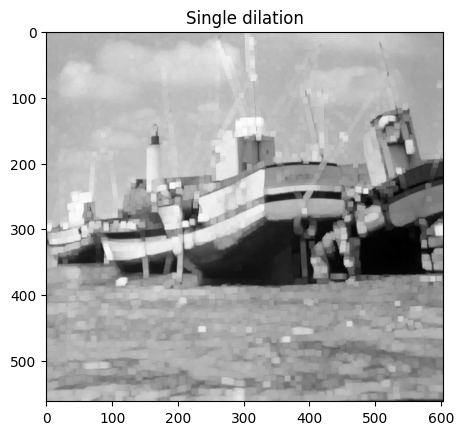

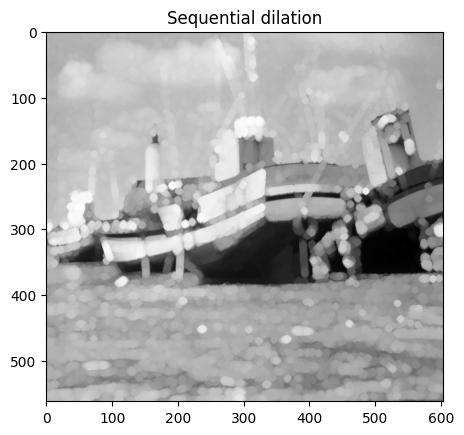

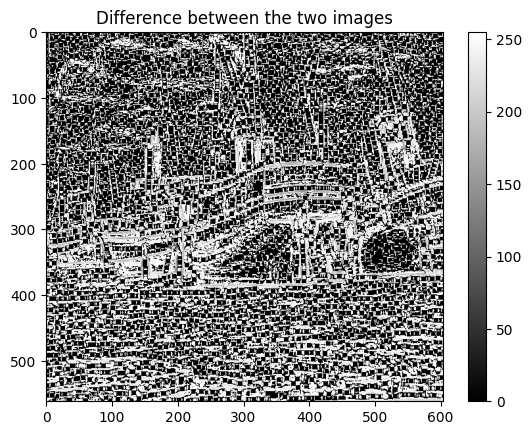

37973074


In [53]:
if student:
 # First create the sequential structuring element, that is a disk of size 2 dilated by a disk of size 3
  sqr_strell = morpho.disk(2)
  sqr_strell = np.pad(sqr_strell,1)
  sqr_strell = morpho.dilation(sqr_strell,morpho.disk(3))
  print(sqr_strell)

  # Use it to perform the image dilation
  dilation = morpho.dilation(img,sqr_strell)
  plt.imshow(dilation,cmap = "gray")
  plt.title("Single dilation")    img*(B*B)        (img*B)*B
  plt.show()
  
  # Compare it with the sequential dilation
  sequential_dilation = morpho.dilation(morpho.dilation(img,morpho.disk(2)),morpho.disk(3))
  plt.imshow(sequential_dilation,cmap = "gray")
  plt.title("Sequential dilation")
  plt.show()
    
  plt.imshow(dilation-sequential_dilation,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation)))

- **Q:** How can you illustrate the idempotence of closing ? Show your illustration in the following cell.


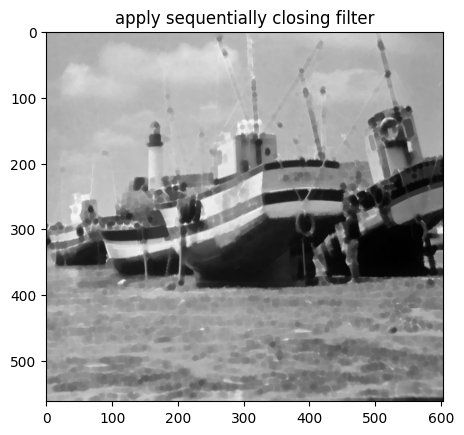

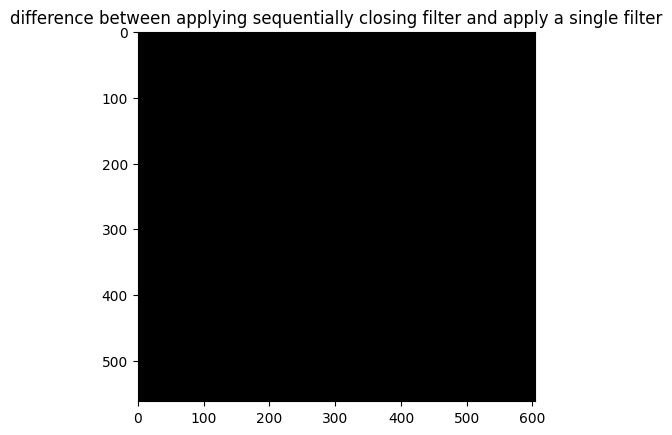

In [59]:
if student :
    strell = morpho.disk(3)
    plt.title('apply sequentially closing filter')
    plt.imshow(morpho.closing(morpho.closing(img,strell),strell),cmap='gray')
    plt.show()

    plt.title('difference between applying sequentially closing filter and apply a single filter')
    plt.imshow(morpho.closing(morpho.closing(img,strell),strell) - morpho.closing(img,strell) , cmap = 'gray')

- **Q** : Perform a top-hat transform in the following cell (difference between the image and its opening).
Comment the result depending on the choice of the structuring element.
- **A** :
     - With a disk structuring element, the top-hat transform enhances bright spots
and details that are smaller than the disk radius.
     - With a rectangular structuring element, the top-hat transform enhances
linear features that are oriented along the rectangle's main axis and
have a length smaller than the rectangle's length.
     - In both cases, the top-hat transform helps to isolate bright details
that stand out from the overall background. The choice of the structuring
element depends on the kind of details you want to highlight

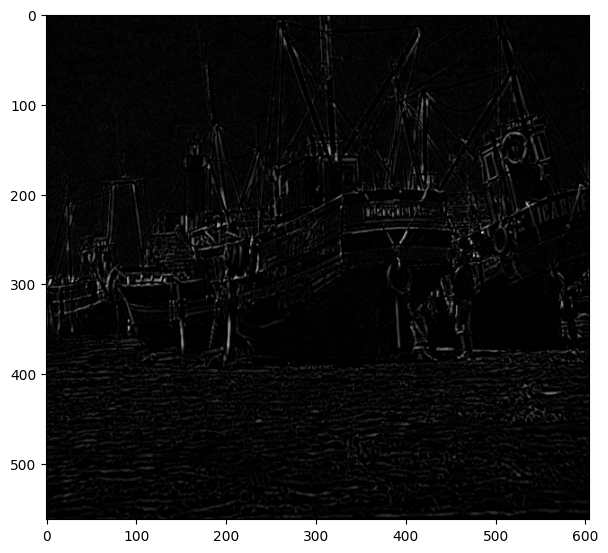

In [61]:
if student:
  ### start code
  strell = morpho.disk(2)
  top_hat = img - morpho.opening(img,strell)
plt.figure(figsize = (7,7))
plt.imshow(top_hat,cmap = "gray")
plt.show()

- **Q** : Perform a dual top-hat transform in the following cell (difference between the closing and the image).
Comment the result depending on the choice of the structuring element.
- **A** : With a disk structuring element, the dual top-hat transform enhances dark spots and details that are smaller than the disk radius. With a rectangular structuring element, the dual top-hat transform enhances linear features that are oriented along the rectangle's main axis and have a length smaller than the rectangle's length. In both cases, the dual top-hat transform helps to isolate dark details that stand out from the overall background. The choice of the structuring element depends on the kind of details we want to highlight.

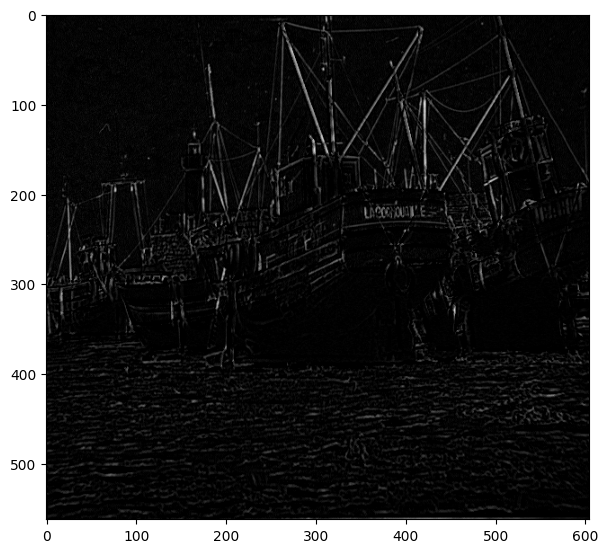

In [63]:
if student:
  ### start code
  strell = morpho.disk(2)
  dual_top_hat = morpho.closing(img,strell) - img
plt.figure(figsize = (7,7))
plt.imshow(dual_top_hat,cmap = "gray")
plt.show()

### Alternating Filters
- **Q**: Perform alternate sequential filters, for instance by performing sequential opening and then closing by squares of radius ranging from 1 to 5. Also try out your own combinations. What kind of filtering can be expected from such
operations?
- **A**:
Performing alternating sequential filters like opening followed by closing can help to remove noise while preserving the overall shape of objects in the image.

  - opening followed by closing can help to remove small objects and fill in small holes.
  - Trying different combinations of filters and structuring elements allows to achieve various filtering effects, such as smoothing in the erosion then dilatitaion

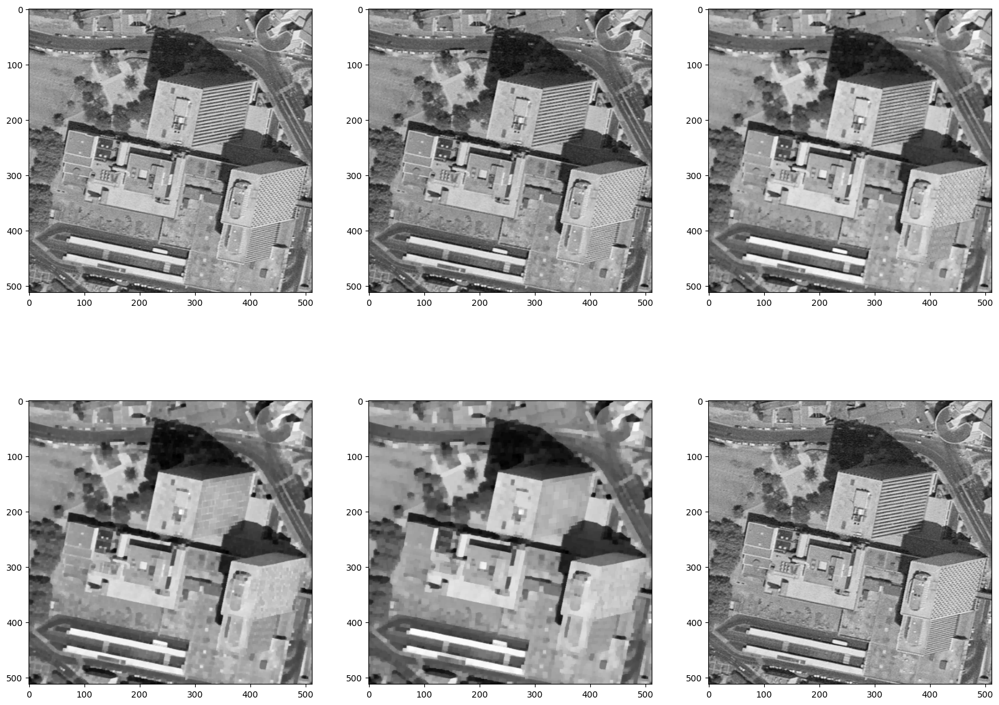

In [64]:
# Example
img = skio.imread("images/montreuil.tif")


# Structuring elements
se1=morpho.square(1)
se2=morpho.square(2)
se3=morpho.square(3)
se4=morpho.square(4)
se5=morpho.square(5)

# Images
fas1=morpho.opening(img,se1)
fas2=morpho.closing(fas1,se2)
fas3=morpho.opening(fas2,se3)
fas4=morpho.closing(fas3,se4)
fas5=morpho.opening(fas4,se5)

fig,ax = plt.subplots(2,3,figsize = (20,15))
ax[0,0].imshow(fas1,cmap = "gray")
ax[0,1].imshow(fas2,cmap = "gray")
ax[0,2].imshow(fas3,cmap = "gray")
ax[1,0].imshow(fas4,cmap = "gray")
ax[1,1].imshow(fas5,cmap = "gray")
ax[1,2].imshow(img,cmap = "gray")
plt.show()


### Segmentation
 - **Q** : Apply a morphological gradient to the image cell.tif (difference between
dilation and erosion with a structuring element of radius1). What do you observe ?

- **A**: (code in the following cell) ...

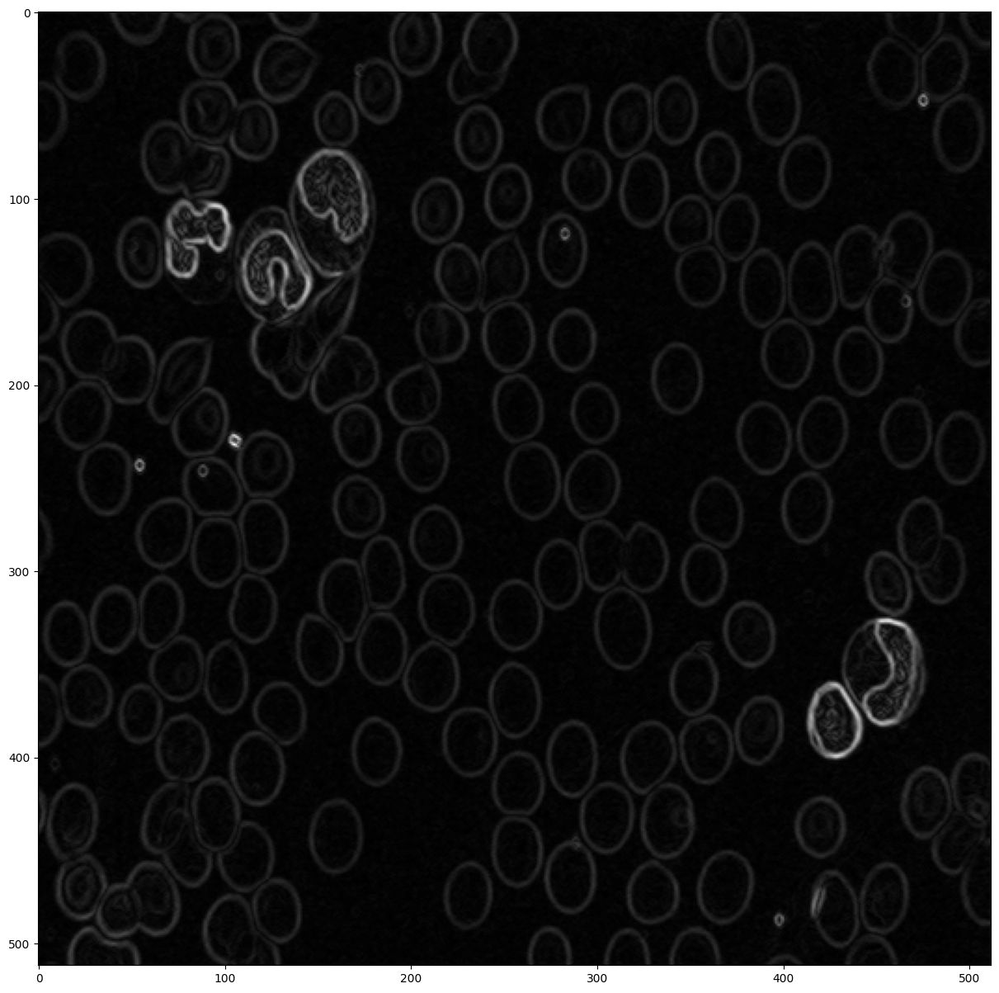

In [65]:
if student : 
    img = skio.imread("images/cell.tif")
    strell = morpho.disk(1)
    morpho_grad = morpho.dilation(img,strell) - morpho.erosion(img,strell)
plt.figure(figsize=(15,15))
plt.imshow(morpho_grad,cmap = "gray")
plt.show()


- **Q** : Try to threshold the gradient with a value of 25 for instance. Why is is difficult to find an appropriate threshold value ?
- **A** : (code in the next cell) ...

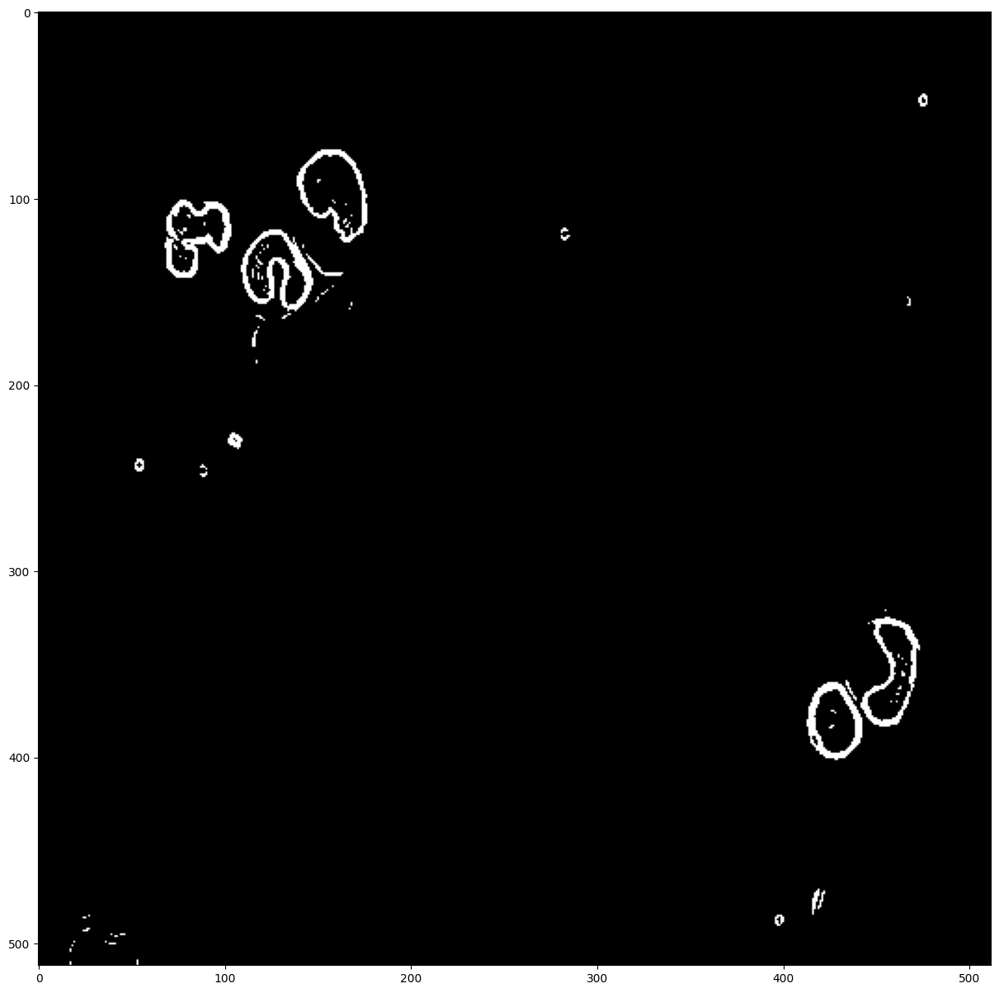

In [81]:
if student :
  thresh_grad = np.where(morpho_grad>25,1,0)
plt.figure(figsize=(15,15))
plt.imshow(thresh_grad,cmap  ="gray")
plt.show()

- **Q** Apply the watershed algorithm to the gradient image using seg.watershed(morpho_grad,k) ;
What do you observe ? 
- **A** :(code in the next cell) ...
- **Q** Try to change the parameter k ; what is the role of that parameter ?
- **A** :(code in the next cell) ...

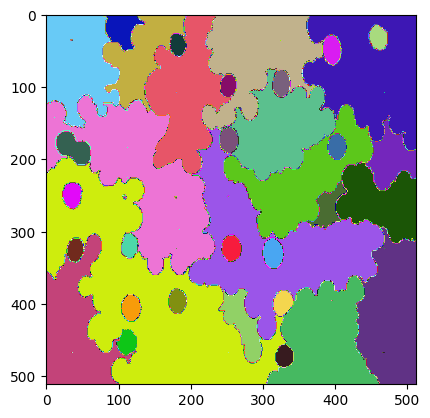

In [82]:
import matplotlib
cmaprand = matplotlib.colors.ListedColormap ( np.random.rand ( 256,3))
if student :
    k=50
    wat = seg.watershed(morpho_grad,k)

plt.imshow(wat, cmap =cmaprand)
plt.show()

- **Q** : Apply first a closing on the gradient image and then the watershed. Is the result better ? In which sense and why ?
- **A** : (code in the next cell) ...
- **Q** : Apply an opening with the same structuring element on the gradient image and then do a watershed. What is the difference between this operation and the previous? 
- **A** : (code in the next cell) ...

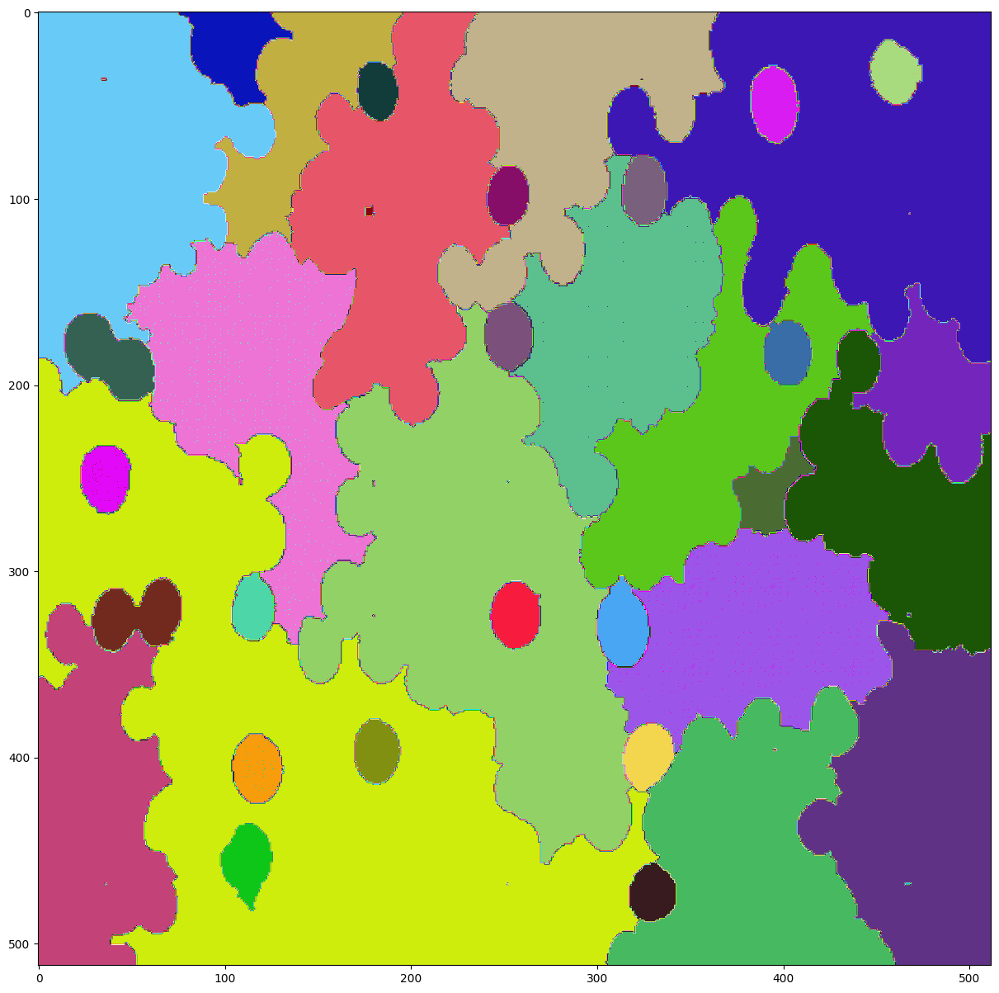

In [83]:
if student :
  wat_closing = seg.watershed(morpho.closing(morpho_grad,strell),k)
plt.figure(figsize =(15,15))
plt.imshow(wat_closing,cmap =cmaprand)
plt.show()

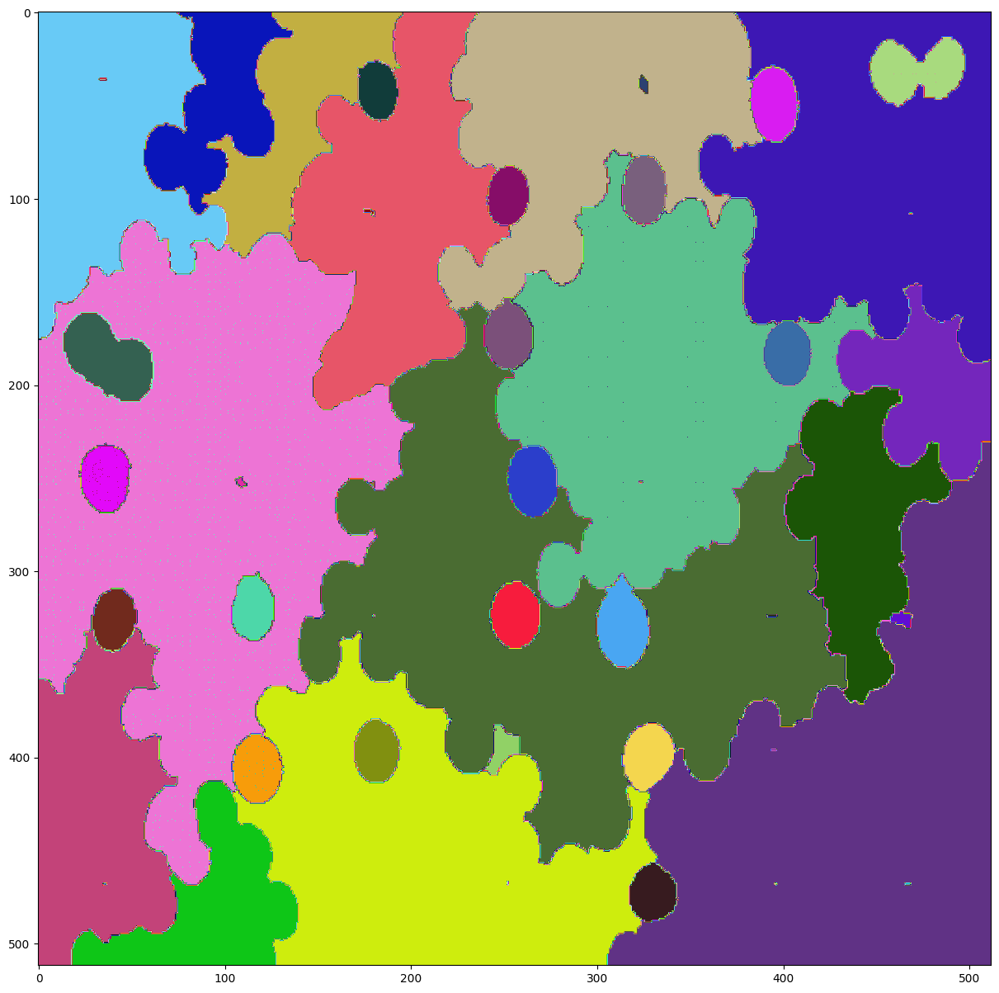

In [84]:
if student :
  wat_opening = seg.watershed(morpho.opening(morpho_grad,strell),k)
plt.figure(figsize =(15,15))
plt.imshow(wat_opening,cmap =cmaprand)
plt.show()

Your objective is to try to do better than what you did with the closure and opening. To do that, we propose to use specific markers for the watershed transform.

**Q** : In the next cell, compute the reconstruction from an opening of the gradient. You can use as structuring element a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : Yes it's slightly better.

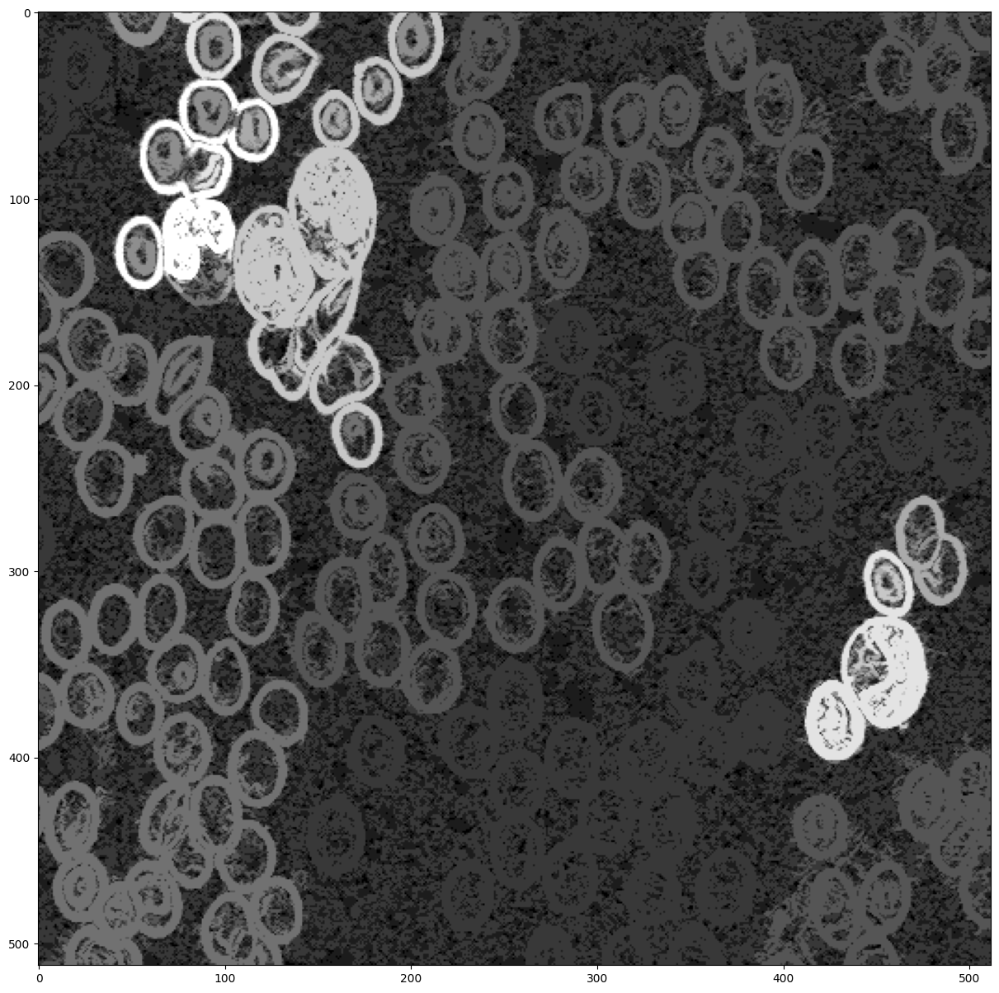

In [85]:
imOpen = morpho.opening(morpho_grad,morpho.disk(5))
reco= skimage.morphology.reconstruction(imOpen,morpho_grad)
plt.figure(figsize =(15,15))
plt.imshow(reco,cmap = "gray")
plt.show()

**Q** : In the next cell, compute the reconstruction from an closing of the gradient. You can use as structuring alement a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : The reconstructed image reveals that it efficiently helps to segment the cells. The reconstruction from closing helps to identify the cells by filling in the gaps and holes in the contours of the cells, leading to a clearer and more complete outline of the cells, thus making it easier to distinguish them from the background.

The cell's boundaries are more clearly defined and the noise is reduced, making it easier to segment and identify the cells. The reconstruction helps to remove false positive regions and to connect the regions which were fragmented in the original gradient image.

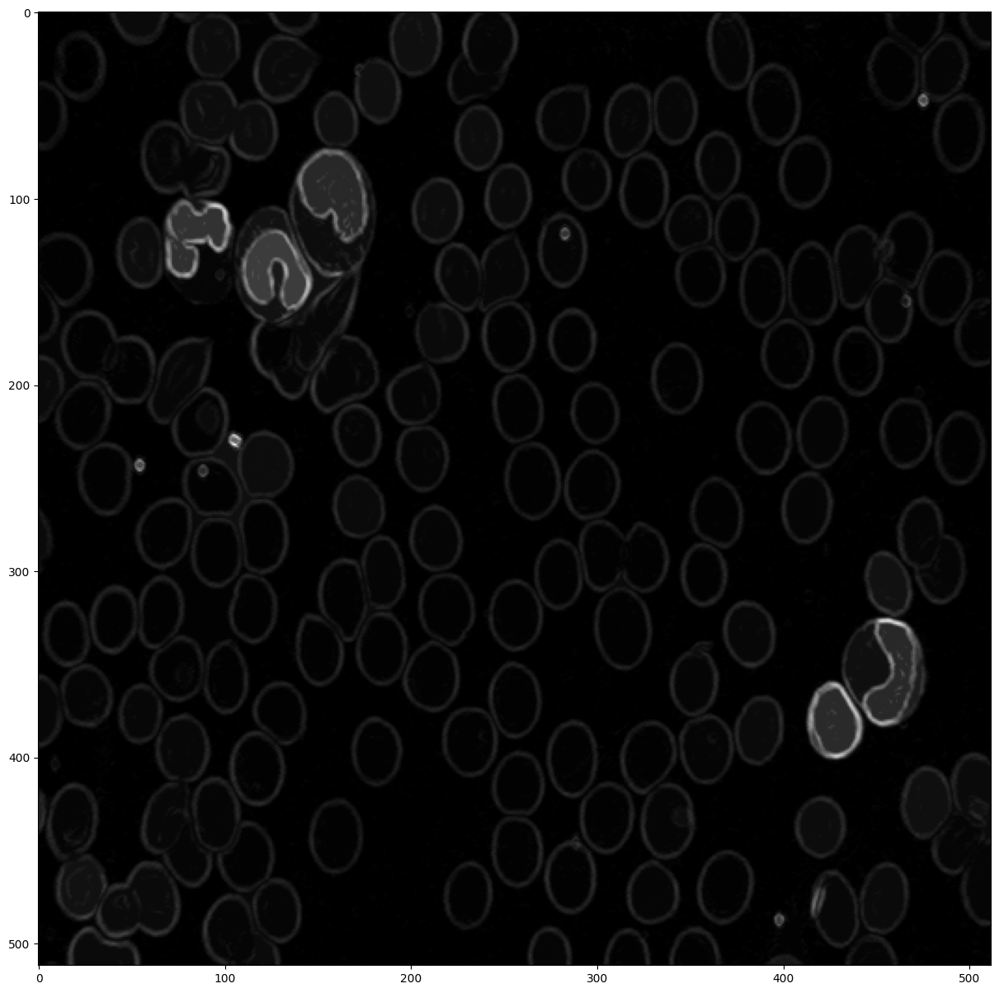

In [93]:
imClos = morpho.closing(morpho_grad,morpho.disk(5))
reco=skimage.morphology.reconstruction(imClos,morpho_grad,method='erosion')
plt.figure(figsize =(15,15))
plt.imshow(reco,cmap = "gray")
plt.show()

**Q** : This last part is less guided. Use the reconstruction operation and the above questions to find good markers for the watershed algorithm. You could benefit from using the peak_local_max function of skimage.feature

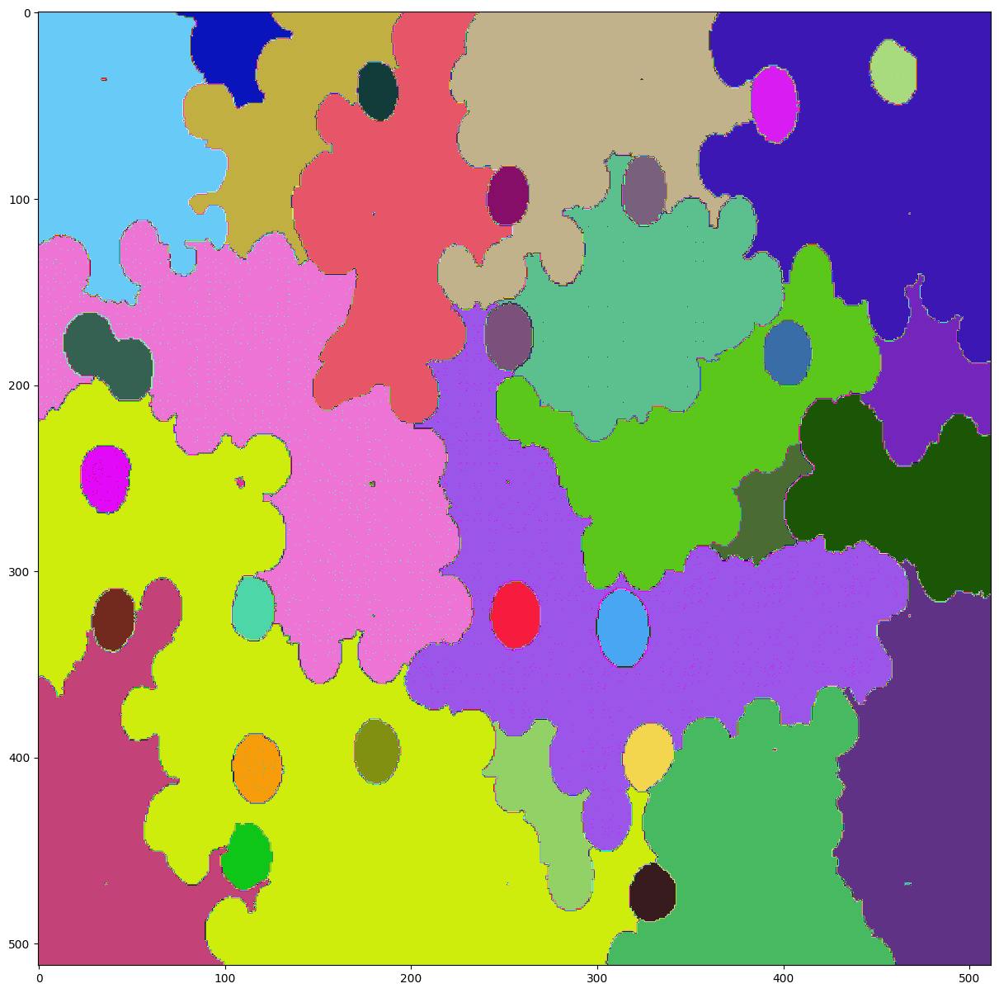

In [94]:
plt.figure(figsize =(15,15))
plt.imshow(wat,cmap =cmaprand)
plt.show()